# Trial of clustering on OpenMap and MasterMap data

This is an explorative notebook comparing simple morphometric clustering of Edinburgh based on OS OpenMap and OS MasterMap building footprints.

Note that since OS MasterMap license does not allow a release of derived open data products, OS MasterMap cannot be used in the final version of spatial signatures anyway. Consider this notebook a sandbox to play at.

In [1]:
import geopandas as gpd
import momepy as mm

In [29]:
mastermap = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh.pq')
openmap = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om.pq')
mastermap_tess = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_mm_tess.pq')
openmap_tess = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om_tess.pq')

## Get small sample of morphometric data

We first measure a small sample of morphometric characters.

In [3]:
mastermap['area'] = mastermap.area
openmap['area'] = openmap.area

In [30]:
openmap_tess['area_t'] = openmap_tess.area
mastermap_tess['area_t'] = mastermap_tess.area

In [32]:
openmap_tess['peri_t'] = openmap_tess.length
mastermap_tess['peri_t'] = mastermap_tess.length

In [8]:
openmap_tess['eri'] = mm.EquivalentRectangularIndex(openmap_tess, 'area_t', 'peri_t').series

In [33]:
mastermap_tess['eri'] = mm.EquivalentRectangularIndex(mastermap_tess, 'area_t', 'peri_t').series

In [10]:
openmap_tess['car'] = mm.AreaRatio(openmap_tess, openmap, 'area_t', 'area', 'uID').series

In [34]:
mastermap_tess['car'] = mm.AreaRatio(mastermap_tess, mastermap, 'area_t', 'area', 'uID').series

In [35]:
mastermap_tess['xID'] = range(len(mastermap_tess))
openmap_tess['xID'] = range(len(openmap_tess))

In [36]:
openmap = openmap.merge(openmap_tess[['uID', 'xID']], on='uID', how='left')
mastermap = mastermap.merge(mastermap_tess[['uID', 'xID']], on='uID', how='left')

In [15]:
from libpysal.weights import Queen

In [16]:
om_w1 = Queen.from_dataframe(openmap_tess, idVariable='xID')

In [37]:
mm_w1 = Queen.from_dataframe(mastermap_tess, idVariable='xID')

/opt/conda/lib/python3.7/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
 There are 5 islands with ids: 2497, 16639, 54931, 54961, 98954.
  warnings.warn(message)


In [18]:
om_w3 = mm.sw_high(k=3, weights=om_w1)

In [38]:
mm_w3 = mm.sw_high(k=3, weights=mm_w1)

In [21]:
openmap_tess.columns

Index(['uID', 'geometry', 'eID', 'area_t', 'peri_t', 'eri', 'car', 'xID'], dtype='object')

Let's get some contextual information to use as a clustering input. In this case, interquartile range of each character within 3 topological steps on tessellation.

In [22]:
openmap_tess['area_t_IQR_3steps'] = mm.Range(openmap_tess, 'area_t', om_w3, 'xID', rng=(25, 75)).series

100%|██████████| 74736/74736 [00:46<00:00, 1594.96it/s]


In [23]:
openmap_tess['peri_t_IQR_3steps'] = mm.Range(openmap_tess, 'peri_t', om_w3, 'xID', rng=(25, 75)).series
openmap_tess['eri_IQR_3steps'] = mm.Range(openmap_tess, 'eri', om_w3, 'xID', rng=(25, 75)).series
openmap_tess['car_IQR_3steps'] = mm.Range(openmap_tess, 'car', om_w3, 'xID', rng=(25, 75)).series

100%|██████████| 74736/74736 [00:46<00:00, 1591.84it/s]


In [39]:
mastermap_tess['area_t_IQR_3steps'] = mm.Range(mastermap_tess, 'area_t', mm_w3, 'xID', rng=(25, 75)).series
mastermap_tess['peri_t_IQR_3steps'] = mm.Range(mastermap_tess, 'peri_t', mm_w3, 'xID', rng=(25, 75)).series
mastermap_tess['eri_IQR_3steps'] = mm.Range(mastermap_tess, 'eri', mm_w3, 'xID', rng=(25, 75)).series
mastermap_tess['car_IQR_3steps'] = mm.Range(mastermap_tess, 'car', mm_w3, 'xID', rng=(25, 75)).series

100%|██████████| 234373/234373 [02:26<00:00, 1599.36it/s]


## K-means clustering

To keep the comparison simple, we'll use k-means with few arbitrary `k` options.

### OpenMap

In [11]:
from sklearn import preprocessing
from sklearn.cluster import KMeans

Before clustering, we need to normalize data.

In [12]:
scaler = preprocessing.StandardScaler()

In [47]:
cols = [col for col in openmap_tess.columns if 'IQR' in col]
cols

['area_t_IQR_3steps', 'peri_t_IQR_3steps', 'eri_IQR_3steps', 'car_IQR_3steps']

In [48]:
om_data = scaler.fit_transform(openmap_tess[cols].fillna(0))

In [49]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(om_data)

In [55]:
openmap_tess['cluster'] = kmeans.labels_

In [56]:
openmap_tess['centroid'] = openmap_tess.centroid

<AxesSubplot:>

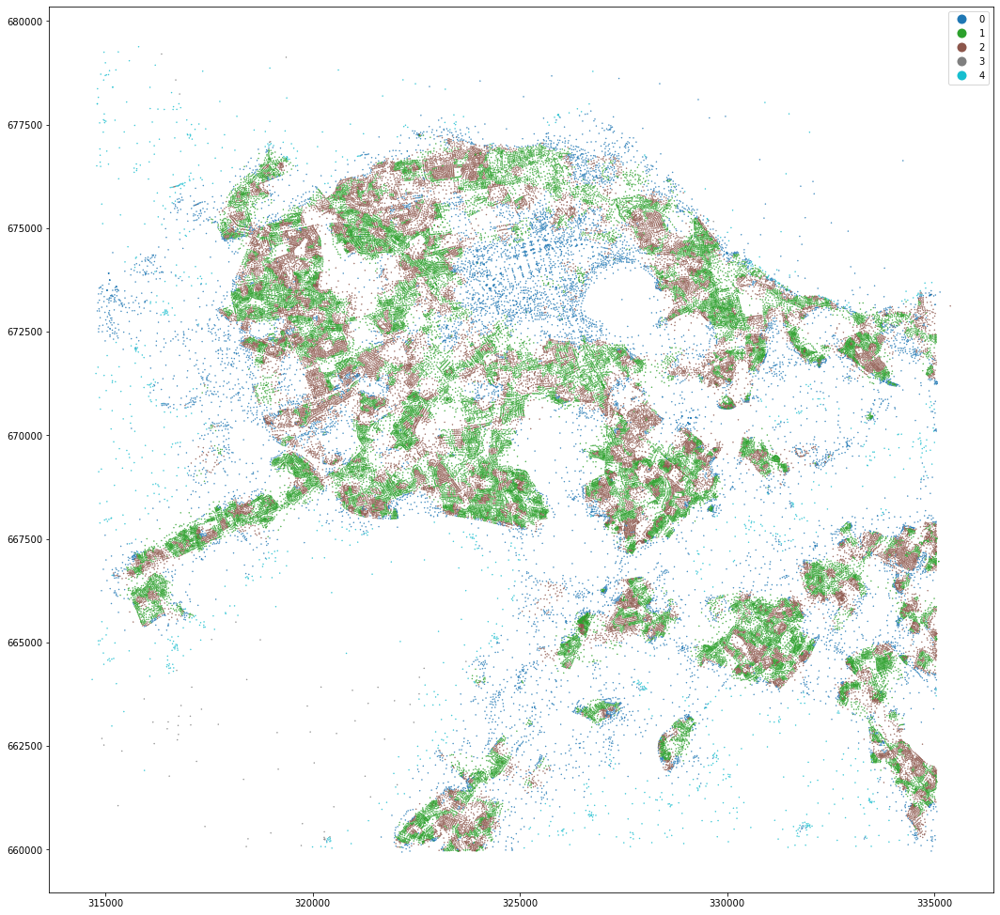

In [58]:
openmap_tess.set_geometry('centroid').plot('cluster', categorical=True, figsize=(18, 18), legend=True, markersize=.2)

<AxesSubplot:>

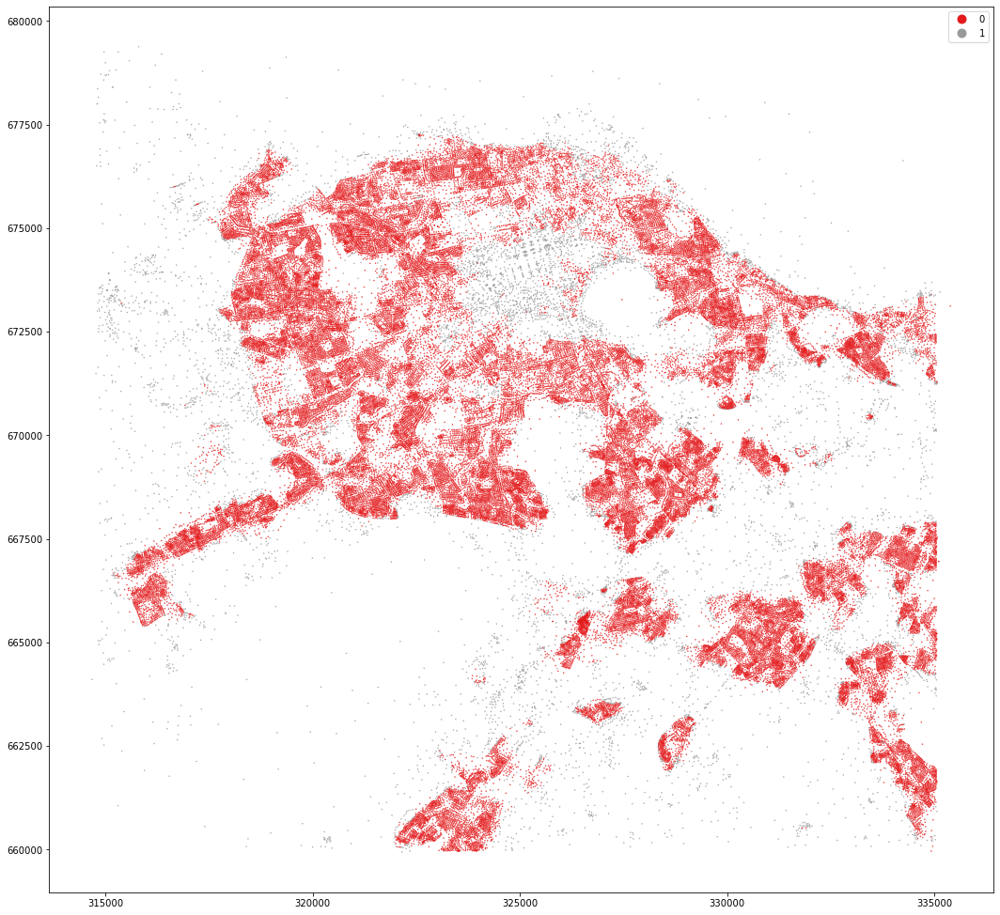

In [68]:
om_data = scaler.fit_transform(openmap_tess[cols].fillna(0))
kmeans = KMeans(n_clusters=2, random_state=0).fit(om_data)
openmap_tess['cluster2'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster2', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

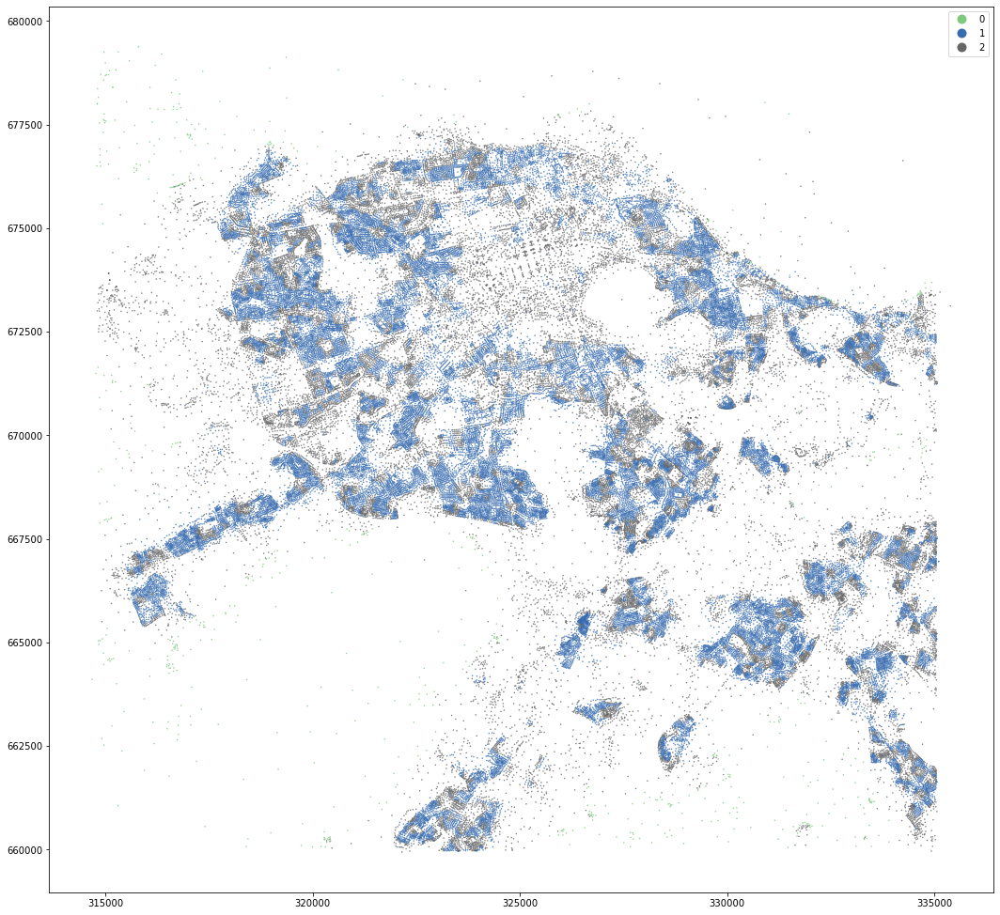

In [70]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(om_data)
openmap_tess['cluster3'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster3', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

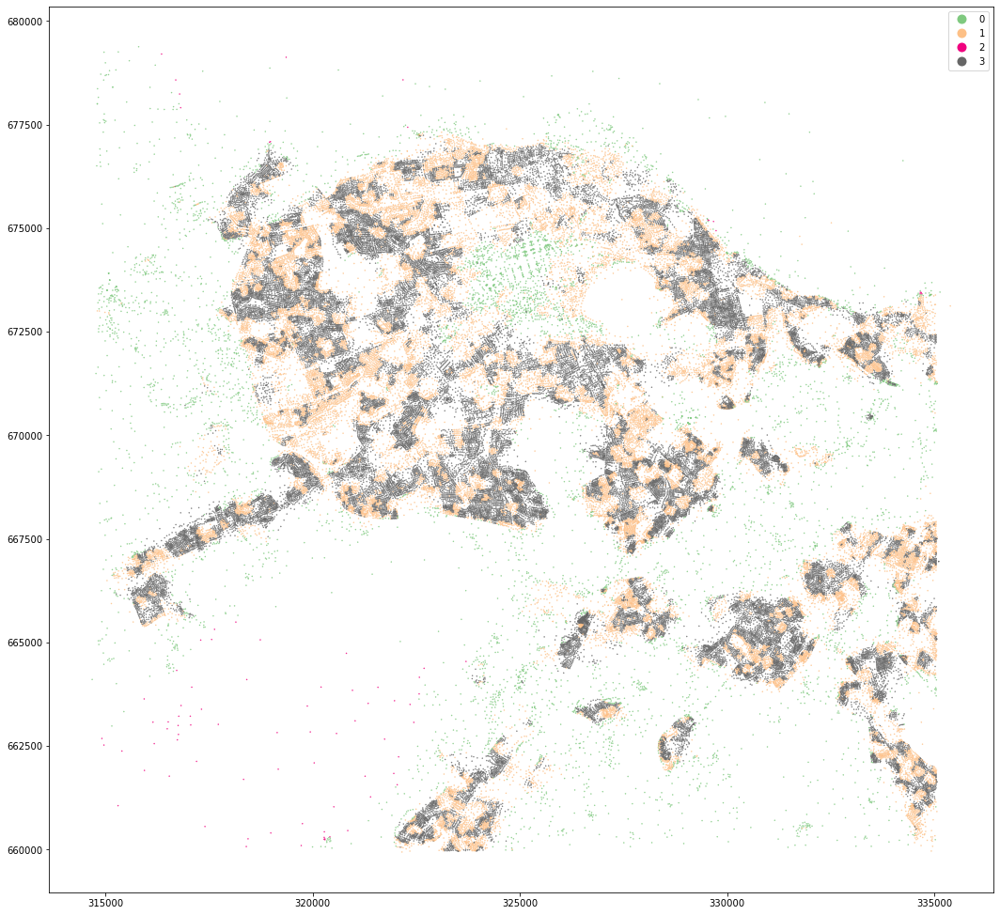

In [71]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(om_data)
openmap_tess['cluster4'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster4', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

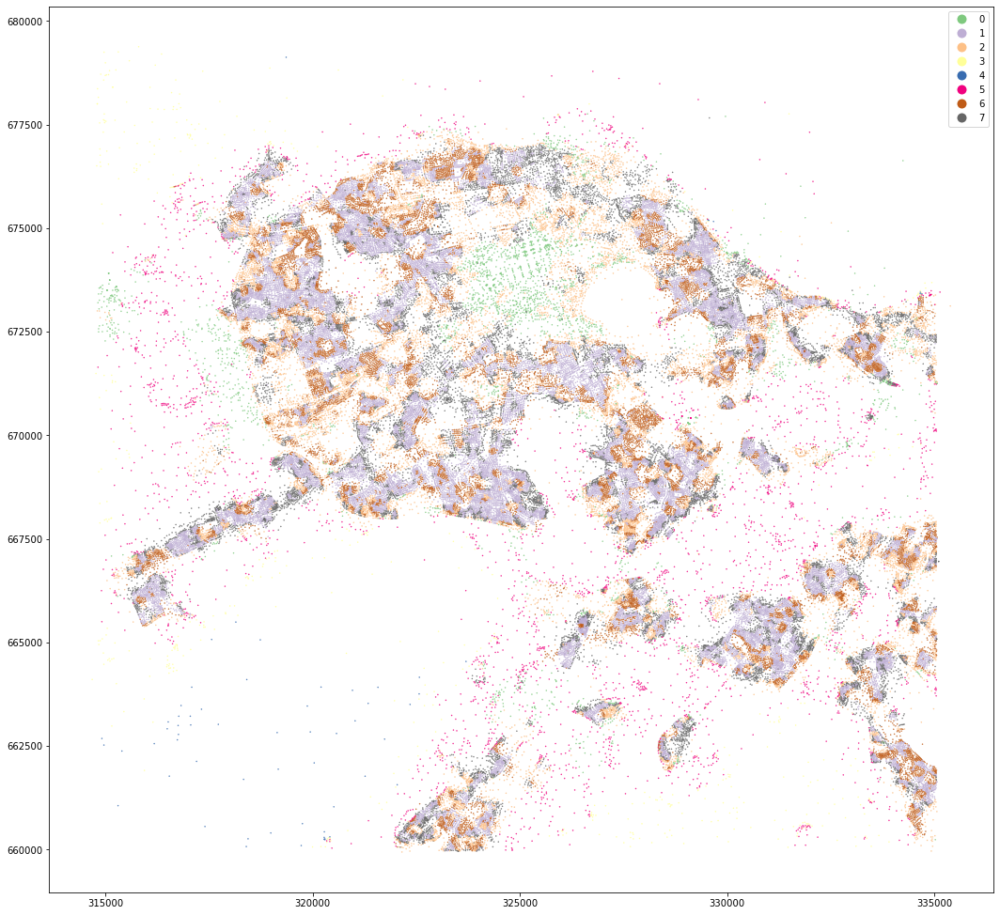

In [72]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(om_data)
openmap_tess['cluster8'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster8', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

|### MasterMap

And the same for Master Map.

In [59]:
om_data = scaler.fit_transform(mastermap_tess[cols].fillna(0))
kmeans = KMeans(n_clusters=5, random_state=0).fit(om_data)
mastermap_tess['cluster'] = kmeans.labels_

<AxesSubplot:>

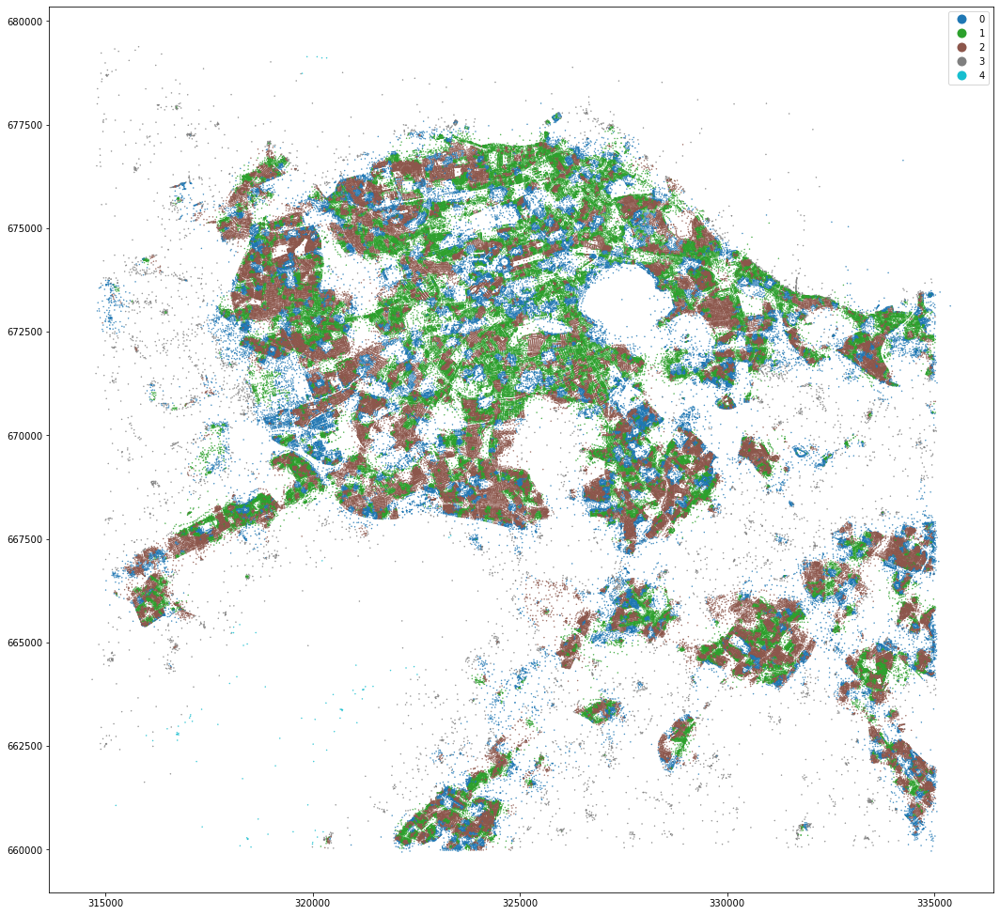

In [60]:
mastermap_tess['centroid'] = mastermap_tess.centroid
mastermap_tess.set_geometry('centroid').plot('cluster', categorical=True, figsize=(18, 18), legend=True, markersize=.2)

In [61]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(om_data)
mastermap_tess['cluster2'] = kmeans.labels_

<AxesSubplot:>

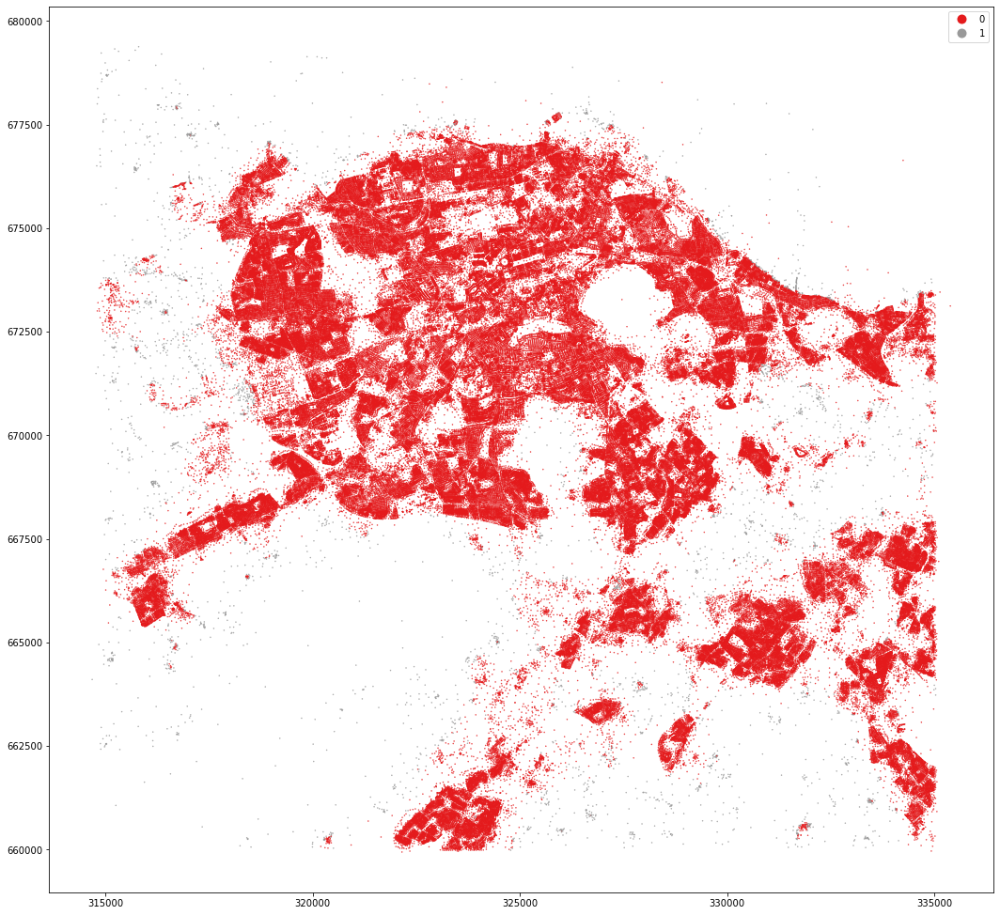

In [64]:
mastermap_tess.set_geometry('centroid').plot('cluster2', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

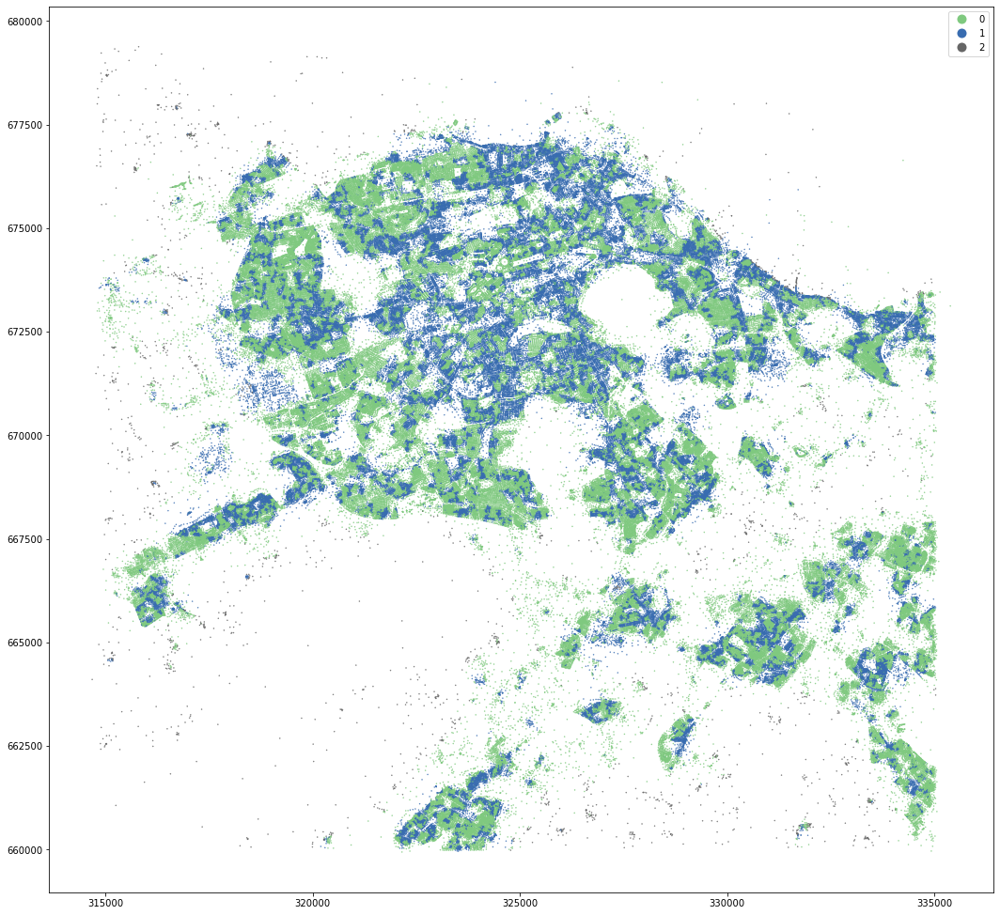

In [66]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(om_data)
mastermap_tess['cluster3'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('cluster3', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

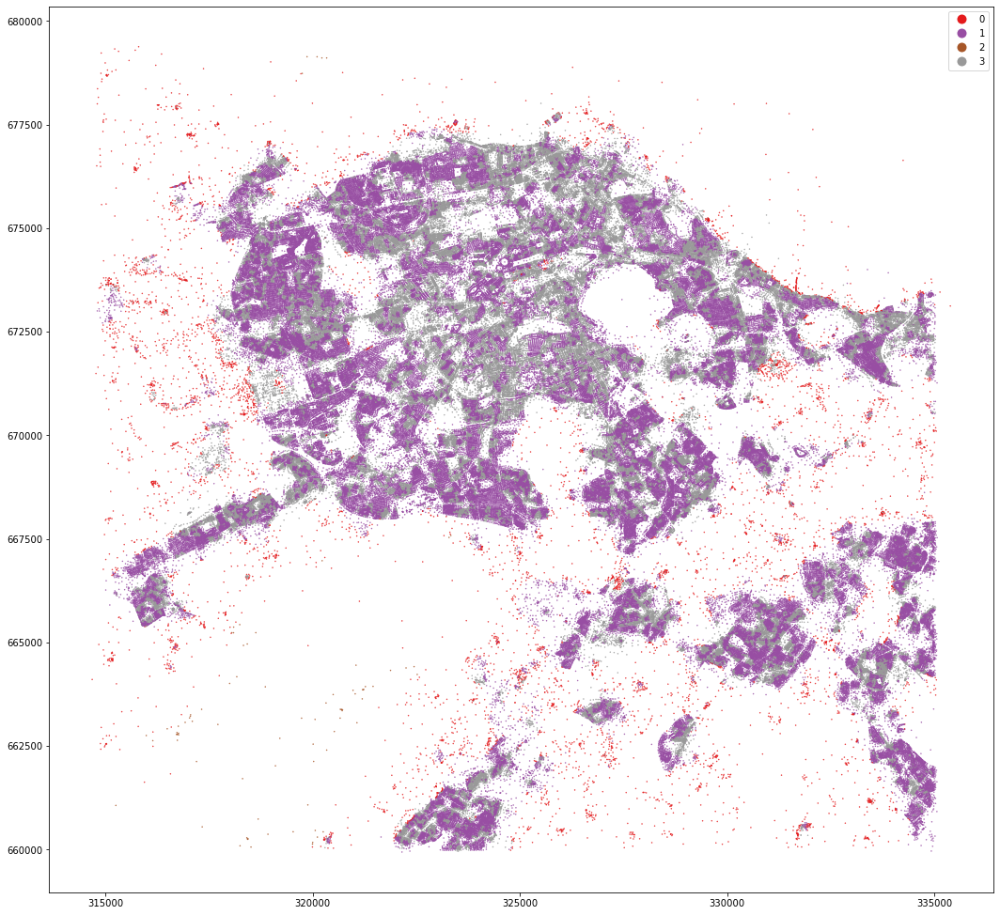

In [67]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(om_data)
mastermap_tess['cluster4'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('cluster4', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

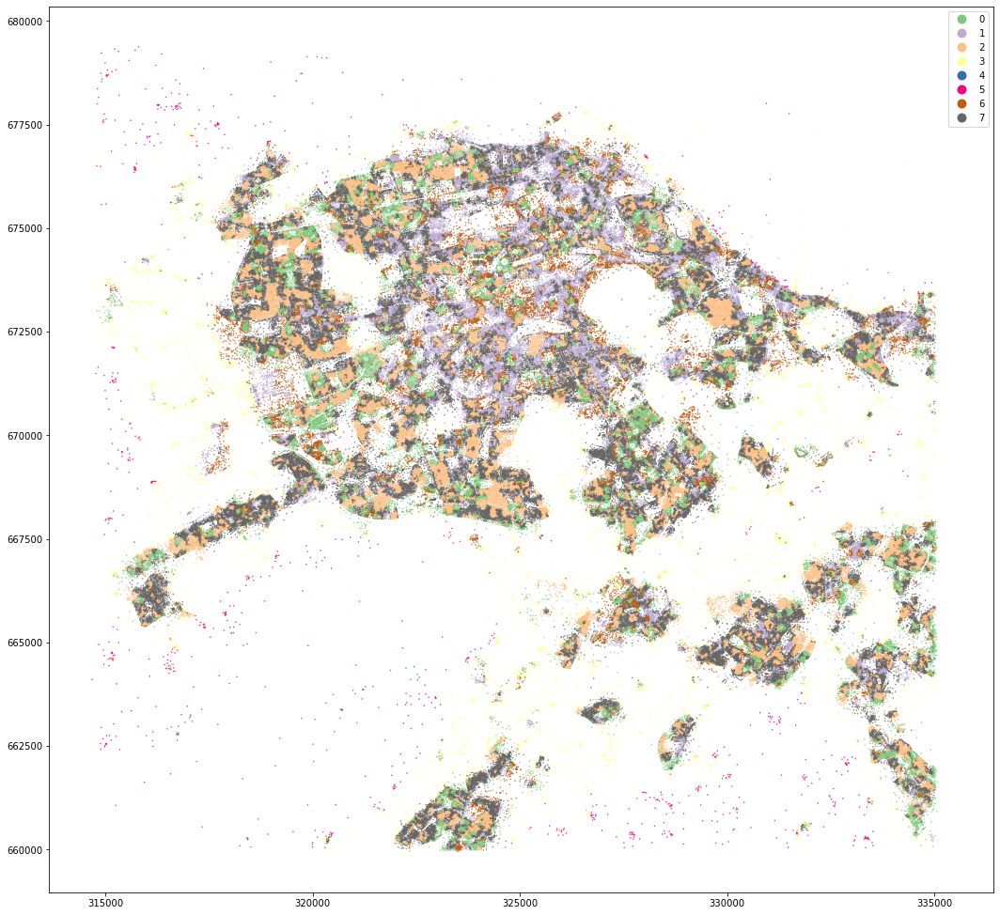

In [74]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(om_data)
mastermap_tess['cluster8'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('cluster8', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

In [75]:
mastermap_tess.to_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_mm_tess_clus.pq')
openmap_tess.to_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om_tess_clus.pq')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: this is an initial implementation of Parquet/Feather file support and associated metadata.  This is tracking version 0.1.0 of the metadata specification at https://github.com/geopandas/geo-arrow-spec

This metadata specification does not yet make stability promises.  We do not yet recommend using this in a production setting unless you are able to rewrite your Parquet/Feather files.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', message='.*initial implementation of Parquet.*')
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: this is an initial implementation of Parquet/Feather file support and associated metadata.  This is tracking version 0.1.0 of the metadata specification at https://github.com/geopandas/geo-arrow-spec

This metadata specification does not yet make stability promise

MasterMap tessellation is more granular and resulting clusters are less geographically defined. OpenMap ones are easier to interpret and understand.

## Using Distance Band

We can try the same with 500m distance band instead of 3 topological steps.

In [2]:
mastermap_tess = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_mm_tess_clus.pq')
openmap_tess = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om_tess_clus.pq')

In [3]:
mastermap_tess

,uID,geometry,eID,area_t,peri_t,eri,car,xID,area_t_IQR_3steps,peri_t_IQR_3steps,eri_IQR_3steps,car_IQR_3steps,area,cluster,centroid,cluster2,cluster3,cluster4,cluster8
0,157286.0,"POLYGON ((323326.909 676984.873, 323325.867 67...",2,873.804255,225.934777,0.562063,0.180165,0,666.197748,100.129941,0.371123,0.079977,157.428753,0,POINT (323326.775 676992.956),0,1,3,6
1,157303.0,"POLYGON ((323475.057 676961.525, 323473.298 67...",2,802.289855,176.174746,0.665618,0.198437,1,350.832797,47.721229,0.106494,0.090254,159.203951,2,POINT (323484.885 676978.164),0,0,1,2
2,157304.0,"POLYGON ((323471.159 676973.522, 323472.390 67...",2,724.075620,170.645266,0.673583,0.221255,2,433.027807,53.880101,0.097254,0.088632,160.205504,2,POINT (323463.722 676979.828),0,0,1,2
3,157305.0,"POLYGON ((323432.776 676953.938, 323430.273 67...",2,1439.420846,214.100873,0.727294,0.130804,3,480.652087,49.794723,0.111968,0.071090,188.282499,2,POINT (323442.141 676990.387),0,0,1,2
4,157306.0,"POLYGON ((323414.241 676950.610, 323411.606 67...",2,1123.509438,241.121390,0.588882,0.166086,4,468.249654,44.169215,0.099367,0.057433,186.598752,2,POINT (323418.964 676980.755),0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234632,NaN,"POLYGON ((334889.340 661707.240, 334904.310 66...",4411,598.206900,105.744247,1.045748,NaN,234368,647.961908,74.645377,0.240902,NaN,NaN,0,POINT (334908.250 661691.303),0,0,1,0
234633,NaN,"POLYGON ((334959.150 671384.620, 334954.920 67...",4412,335.125800,80.540303,0.946900,NaN,234369,1994.516597,118.467083,0.159378,NaN,NaN,0,POINT (334946.846 671370.363),0,0,1,0
234634,NaN,"POLYGON ((334961.130 665328.300, 334975.440 66...",4413,268.215000,66.224449,0.990422,NaN,234370,639.680357,132.029742,0.243493,NaN,NaN,0,POINT (334974.263 665328.501),0,0,1,0
234635,NaN,"POLYGON ((335051.250 661914.606, 335054.630 66...",4414,10.646340,15.569358,0.840680,NaN,234371,801.079377,89.024253,0.145541,NaN,NaN,2,POINT (335052.377 661911.624),0,0,1,0


In [4]:
from libpysal.weights import DistanceBand

In [7]:
# Generating new ID as the xID got messed up along the way. ehm.
openmap_tess['dbID'] = range(len(openmap_tess))
om500 = DistanceBand.from_dataframe(openmap_tess, 500, geom_col='centroid', ids='dbID')

/opt/conda/lib/python3.7/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 70 disconnected components.
 There are 57 islands with ids: 98, 284, 285, 287, 288, 578, 579, 719, 725, 726, 743, 744, 756, 787, 797, 805, 825, 845, 8778, 22150, 22162, 22169, 22175, 22191, 22192, 22210, 22213, 22223, 22224, 22237, 22241, 22242, 22259, 22268, 22282, 22285, 22290, 22292, 22294, 22295, 22296, 22297, 22298, 22299, 22300, 22301, 22305, 22306, 22310, 25018, 25038, 25054, 25065, 25092, 25150, 55446, 73772.
  warnings.warn(message)


In [5]:
# Beware, this requires a ton of memory to compute
mastermap_tess['dbID'] = range(len(mastermap_tess))
mm500 = DistanceBand.from_dataframe(mastermap_tess, 500, geom_col='centroid', ids='dbID')

/opt/conda/lib/python3.7/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 56 disconnected components.
 There are 46 islands with ids: 449, 558, 1211, 1214, 1215, 1217, 2354, 2492, 2875, 2885, 2908, 2909, 2920, 2933, 2946, 2977, 3073, 3234, 3250, 74272, 74276, 74292, 74302, 74304, 74310, 74325, 74350, 74361, 74363, 74364, 74368, 74369, 74428, 74442, 74547, 74592, 74603, 74645, 74646, 82031, 82096, 82174, 82237, 196625, 229787, 233749.
  warnings.warn(message)


In [8]:
openmap_tess['area_t_IQR_500'] = mm.Range(openmap_tess, 'area_t', om500, 'dbID', rng=(25, 75)).series
openmap_tess['peri_t_IQR_500'] = mm.Range(openmap_tess, 'peri_t', om500, 'dbID', rng=(25, 75)).series
openmap_tess['eri_IQR_500'] = mm.Range(openmap_tess, 'eri', om500, 'dbID', rng=(25, 75)).series
openmap_tess['car_IQR_500'] = mm.Range(openmap_tess, 'car', om500, 'dbID', rng=(25, 75)).series

100%|██████████| 74884/74884 [00:56<00:00, 1328.20it/s]


In [9]:
mastermap_tess['area_t_IQR_500'] = mm.Range(mastermap_tess, 'area_t', mm500, 'dbID', rng=(25, 75)).series
mastermap_tess['peri_t_IQR_500'] = mm.Range(mastermap_tess, 'peri_t', mm500, 'dbID', rng=(25, 75)).series
mastermap_tess['eri_IQR_500'] = mm.Range(mastermap_tess, 'eri', mm500, 'dbID', rng=(25, 75)).series
mastermap_tess['car_IQR_500'] = mm.Range(mastermap_tess, 'car', mm500, 'dbID', rng=(25, 75)).series

100%|██████████| 234637/234637 [04:23<00:00, 889.07it/s] 


### OpenMap distance K means

In [13]:
cols = [col for col in openmap_tess.columns if 'IQR_500' in col]
data = scaler.fit_transform(openmap_tess[cols].fillna(0))

<AxesSubplot:>

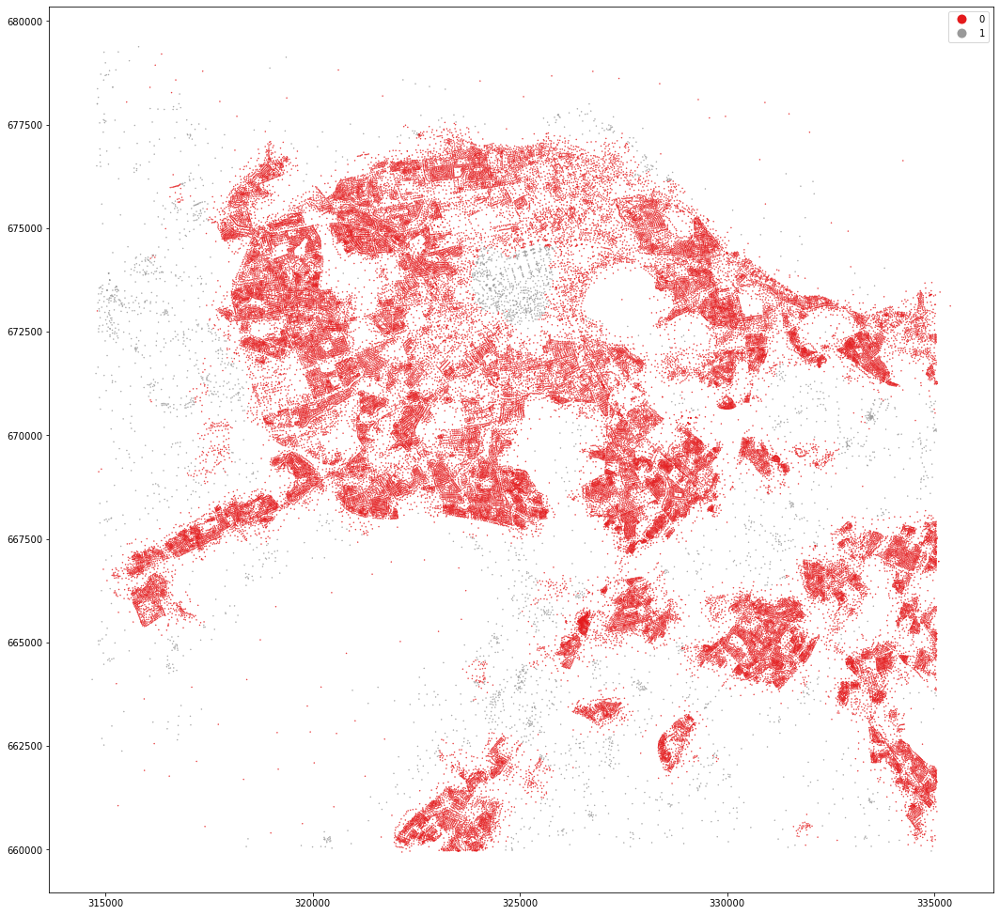

In [14]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(data)
openmap_tess['dist_cluster2'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('dist_cluster2', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

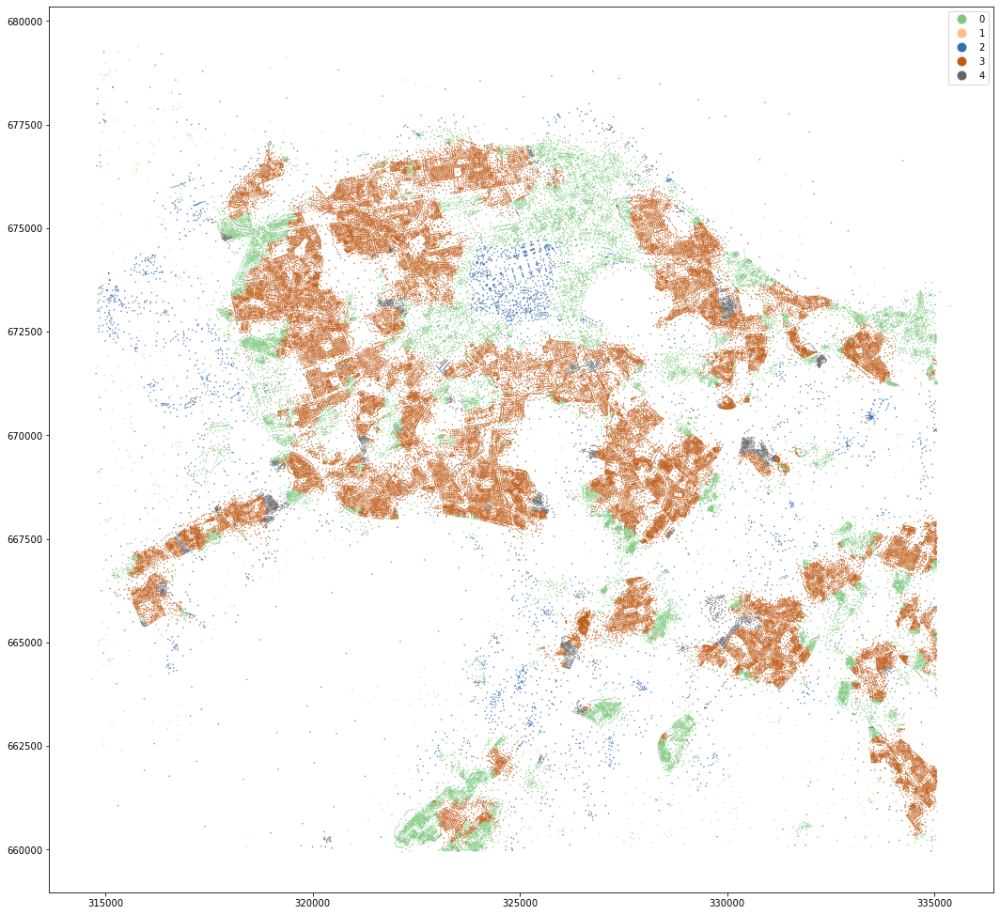

In [15]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(data)
openmap_tess['dist_cluster5'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('dist_cluster5', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

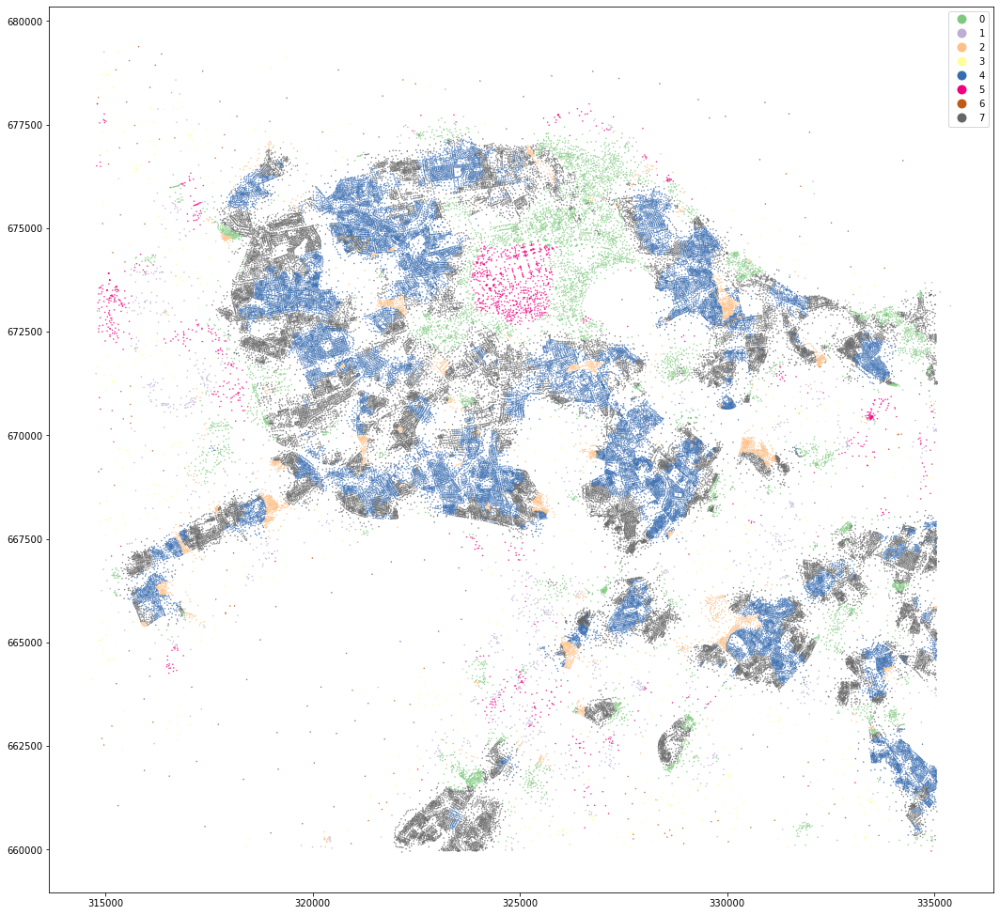

In [16]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(data)
openmap_tess['dist_cluster8'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('dist_cluster8', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

### MasterMap distance K means

In [17]:
data = scaler.fit_transform(mastermap_tess[cols].fillna(0))

<AxesSubplot:>

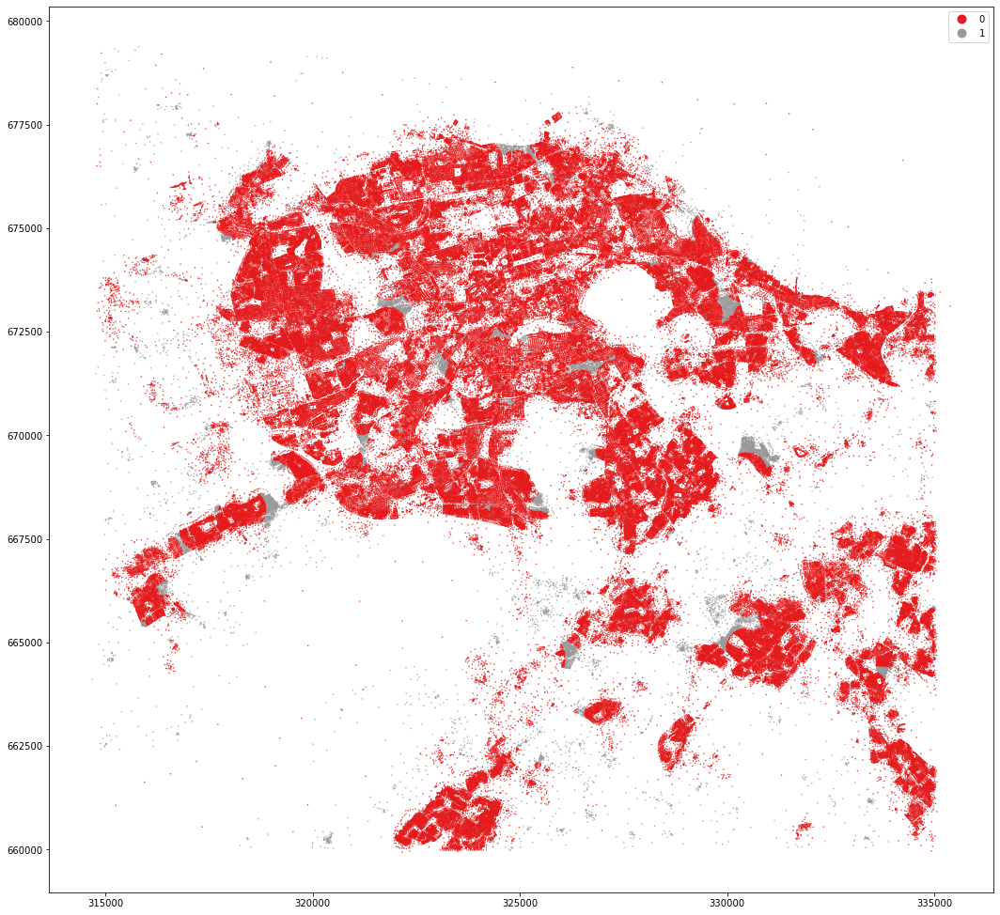

In [18]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(data)
mastermap_tess['dist_cluster2'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('dist_cluster2', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

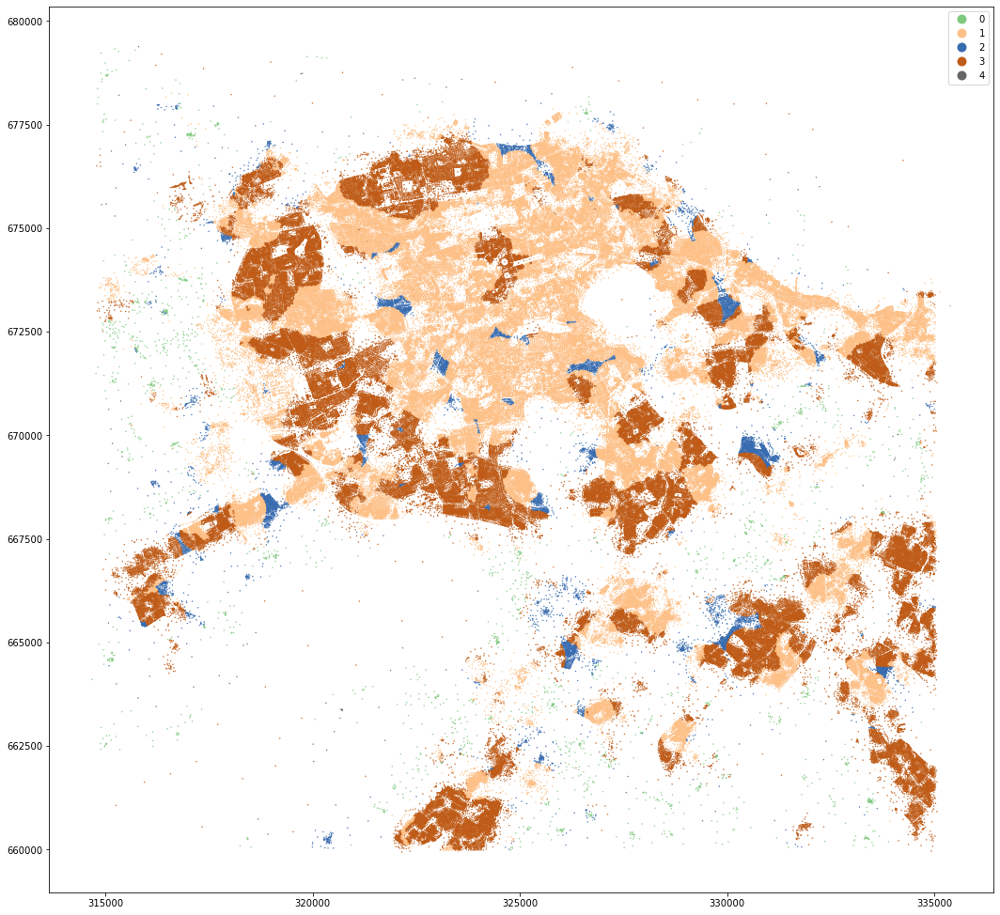

In [19]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(data)
mastermap_tess['dist_cluster5'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('dist_cluster5', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

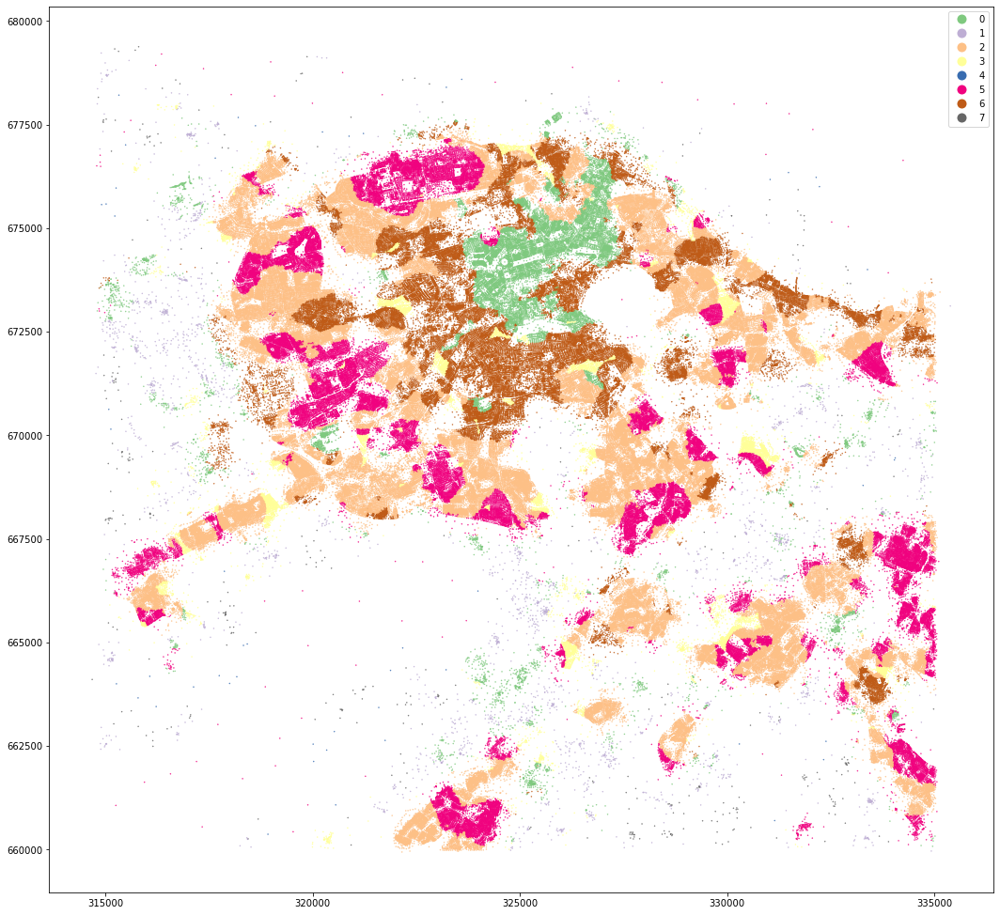

In [20]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(data)
mastermap_tess['dist_cluster8'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('dist_cluster8', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

Again, OpenMap results seem to be easier to understand from small to large `k`. However, MasterMap results for `k=8` look quite reasonable as well. Not that it matters much :).